<a href="https://colab.research.google.com/github/isaacbyr/Practice-Projects/blob/main/Fastai_CNN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

I am currently taking the Fast.ai course on deep learning. For one of the lessons we learned how to scrape bing images and download our own datasets to train a CNN on. I will be building a CNN that can classify between dogs, cats, and pigs. 

Installing Necessary packages. 

In [ ]:
!pip install -Uqq fastbook
import fastbook
fastbook.setup_book()

     |████████████████████████████████| 727kB 10.6MB/s 
     |████████████████████████████████| 194kB 24.7MB/s 
     |████████████████████████████████| 1.2MB 34.9MB/s 
     |████████████████████████████████| 51kB 6.4MB/s 
     |████████████████████████████████| 61kB 8.0MB/s 
Mounted at /content/gdrive


In [ ]:
from fastbook import *
from fastai.vision.widgets import *

In [ ]:
import os 
import requests
import matplotlib.pyplot as plt

In [ ]:
# create a path to store the images using os

try:
  os.mkdir('images')
except:
  pass

In [ ]:
# Using the bing API key. Some googling around or checking the fastai discussion forums will help you find this

key = '0e4c8100e7e8425e9e039ea4930f5687'

search_url = "https://api.bing.microsoft.com/v7.0/images/search"
headers = {"Ocp-Apim-Subscription-Key" : key}

In [ ]:
# Lets first make sure that our setup is actually correct. Lets start by scraping only images of dogs

search_item= 'dogs'

params = {'q': search_item, 'license':'public', "imageType":'photo', 'count':'150'}

In [ ]:
response = requests.get(search_url, headers=headers, params=params)
response.raise_for_status()
results = response.json()

In [ ]:
# Checking our search results to make sure that it worked
results

In [ ]:
# storing thumbnails urls
thumb_urls = [img['thumbnailUrl'] for img in results['value'][:12]]

# checking to see that it worked
thumb_urls

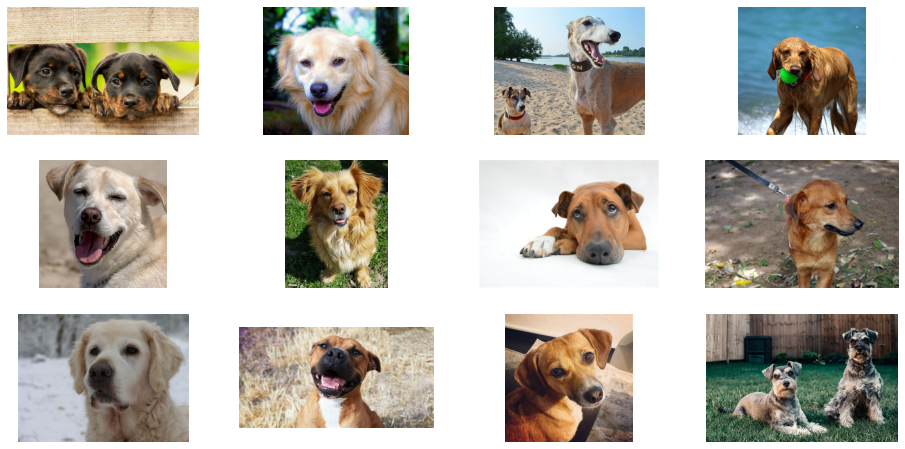

In [ ]:
# Display some of the images using the thumbnail url
f, ax = plt.subplots(3,4, figsize=(16,8))

for i in range(3):
  for j in range(4):
    img = requests.get(thumb_urls[i+3*j])
    img = Image.open(BytesIO(img.content))
    ax[i][j].imshow(img)
    ax[i][j].axis('off')

Now that we know we can download images of dogs using the Bing API,
we can also download images of cats, and pigs to train our model on

In [ ]:
animal_types = ['cats','pigs', 'dogs']

path = Path('tester')

In [ ]:
if not path.exists():
    path.mkdir()
    for animal in animal_types:
        dest = (path/animal)
        dest.mkdir(exist_ok=True)
        
        # Obtaining list of image URLs with that alcohol type keyword
        search_term = animal
        params  = {"q": search_term, "license": "public", "imageType": "photo", "count":"150"}
        response = requests.get(search_url, headers=headers, params=params)
        response.raise_for_status()
        search_results = response.json()
        search_results
        img_urls = [img['contentUrl'] for img in search_results["value"]]
        
        # Downloading images from the list of image URLs
        download_images(dest, urls=img_urls)

In [ ]:
# can use the get_image_files function to get the path of certain images

img_files = get_image_files(path)
img_files

(#385) [Path('tester/dogs/00000140.jpg'),Path('tester/dogs/00000066.jpg'),Path('tester/dogs/00000103.jpg'),Path('tester/dogs/00000018.jpg'),Path('tester/dogs/00000077.jpg'),Path('tester/dogs/00000045.jpg'),Path('tester/dogs/00000072.jpg'),Path('tester/dogs/00000003.jpg'),Path('tester/dogs/00000027.jpg'),Path('tester/dogs/00000142.jpg')...]

In [ ]:
# fast.ai has a bunch of great built in functions such as verify_images that let us see if any images are corrupt

failed_images = verify_images(img_files)
failed_images

(#6) [Path('tester/dogs/00000146.jpg'),Path('tester/pigs/00000081.jpg'),Path('tester/pigs/00000085.jpg'),Path('tester/cats/00000124.jpg'),Path('tester/cats/00000035.jpg'),Path('tester/cats/00000136.jpg')]

In [ ]:
# the number 8 above lets us know that we have 8 images that are corrput, we can simply unlink them from our data

failed_images.map(Path.unlink)

(#6) [None,None,None,None,None,None]

### Preparing Dataset and working with DataLoaders

In [ ]:
animals = DataBlock(
    blocks = (ImageBlock, CategoryBlock),
    get_items = get_image_files,
    splitter = RandomSplitter(valid_pct = 0.2, seed = 42),
    get_y = parent_label,
    item_tfms = Resize(128)
)

In [ ]:
# initialize the dataloaders

dls = animals.dataloaders(path)

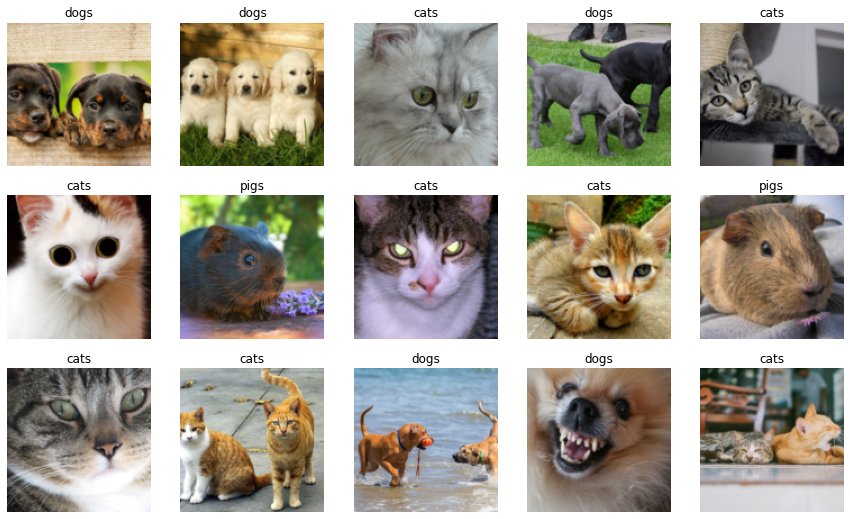

In [ ]:
# using show_batch we can look at some of the images in our validation set

dls.valid.show_batch(max_n=15, nrows = 3)
# looking at the code below we can see that there are some mislabells such as a guinea pig being labelled as pig.
# We can go in later and use a handy fast.ai function to clean this up

### Data Augmentation

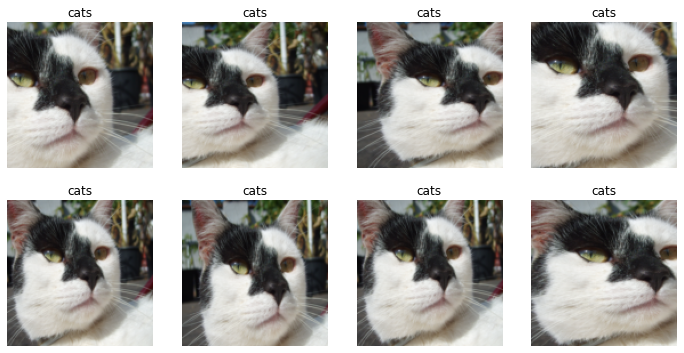

In [ ]:
# we can augment or data to help reduce the chances of overfitting

# this code will ranomdly resize and image to 128,128 and zoom in on the image
animals = animals.new(item_tfms=RandomResizedCrop(128,min_scale=0.3)) 
dls = animals.dataloaders(path)
dls.train.show_batch(max_n=8, nrows=2, unique=True)

# we can see that the image is randomaly zoomed up in a number of different ways

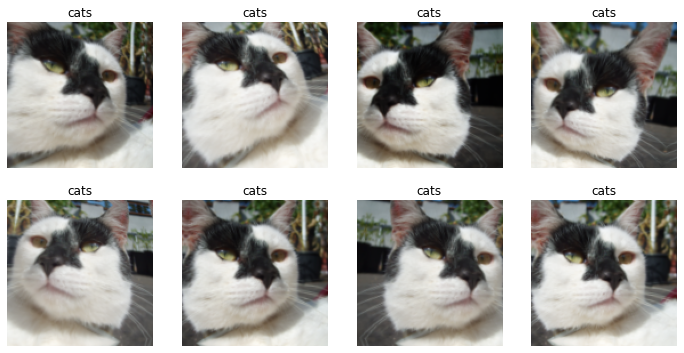

In [ ]:
# while the code above applies a transformation to a single image we can also apply a transformation to a batch of images

animals = animals.new(item_tfms=Resize(128), batch_tfms=aug_transforms())
dls = animals.dataloaders(path)
dls.train.show_batch(max_n=8, nrows=2, unique=True)
# we can see below how aug_transforms() transforms the data, by flipping, zooming, cropping, and stretching the image

### Training the Model

In [ ]:
animals = animals.new(
    item_tfms = RandomResizedCrop(224, min_scale = 0.3),
    batch_tfms = aug_transforms()
)

dls = animals.dataloaders(path)

In [ ]:
# we will be using a resnet34 cnn to train this model on

learn = cnn_learner(dls, resnet34, metrics = error_rate)
learn.fine_tune(2)

Downloading: "https://download.pytorch.org/models/resnet34-333f7ec4.pth" to /root/.cache/torch/hub/checkpoints/resnet34-333f7ec4.pth


epoch,train_loss,valid_loss,error_rate,time
0,1.292995,0.364453,0.133333,00:43


epoch,train_loss,valid_loss,error_rate,time
0,0.359638,0.115398,0.066667,00:43
1,0.253412,0.064423,0.040000,00:43


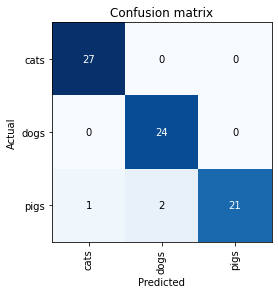

In [ ]:
interpreter = ClassificationInterpretation.from_learner(learn)
interpreter.plot_confusion_matrix()

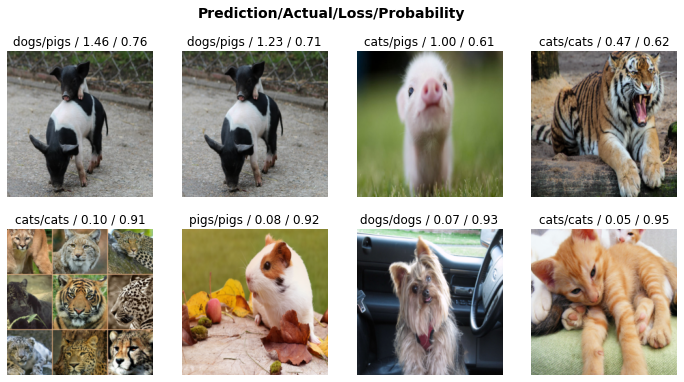

In [ ]:
interpreter.plot_top_losses(8, nrows=2)

### Cleaning the Data
Remember how I mentioned above that we had a couple images that didnt really make sense in our dataset, such as guinea pigs calssified as pigs, well now we can fix that with a built in fast.ai function 

In [ ]:
cleaner = ImageClassifierCleaner(learn)
cleaner

In [ ]:
# deleting the images that I marked as delete
for idx in cleaner.delete(): cleaner.fns[idx].unlink()

In [ ]:
# Retraing our model after data cleaning

dls = animals.dataloaders(path)

learn_1 = cnn_learner(dls, resnet34, metrics=error_rate)
learn_1.fine_tune(3)

epoch,train_loss,valid_loss,error_rate,time
0,1.833078,0.190350,0.057143,00:39


epoch,train_loss,valid_loss,error_rate,time
0,0.473928,0.099717,0.042857,00:39
1,0.347633,0.053945,0.028571,00:40
2,0.259459,0.050231,0.028571,00:40


Perfect, we can see from above that cleaning our data resulted in increasing our accuracy. We know have an accuracy of 1-error_rate equals approx 97%.

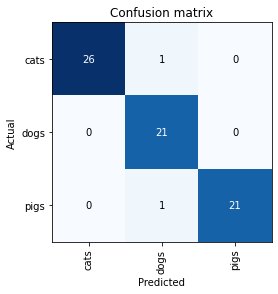

In [ ]:
interpretation = ClassificationInterpretation.from_learner(learn_1)
interpretation.plot_confusion_matrix()

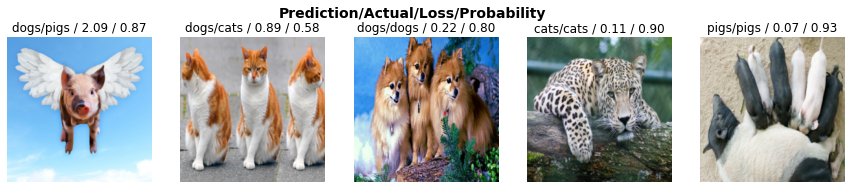

In [ ]:
interpretation.plot_top_losses(5, nrows=1)
# as we can see there is still some misreprented images in our data such as the lepoard in image 4. This is a problem to be aware of
# when using the bing image downloader